# 대스타

필요한 코드 정리 및 실제 사용해보기

#### 필요한 라이브러리 pip로 설치

In [ ]:
pip install Pillow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


#### 필요 라이브러리 선언

In [ ]:
#경로 접근을 위한 라이브러리
import os 

#이미지 출력을 위한 라이브러리
%matplotlib inline

import matplotlib.image as mpimg
import matplotlib.pyplot as plt

import cv2
from google.colab.patches import cv2_imshow

#계산을 위한 라이브러리
import numpy as np

from PIL import Image

#색공강 변환을 위한 라이브러리
from skimage import color

#### dataset 불러오기

In [ ]:
#기본 경로 설정
base_dir = '/content/drive/MyDrive'

#학습 데이터 경로
train_dir = os.path.join(base_dir, 'train')

print(train_dir)

/content/drive/MyDrive/train


#### 들어온 데이터 확인

In [ ]:
#os.listdir() 메서드 = 경로 내에 있는 파일의 이름을 리스트의 형태로 반환

#들어온 이미지 중 5개만 확인
train_fnames = os.listdir(train_dir)
print(train_fnames[:5])

#현재 학습 입력된 학습 이미지 개수 확인
print('Total training images :', len(os.listdir(train_dir)))

['train_1071.jpg', 'train_1078.jpg', 'train_1084.jpg', 'train_1083.jpg', 'train_1079.jpg']
Total training images : 2082


#### 기본적인 openCV를 이용한 이미지 입출력

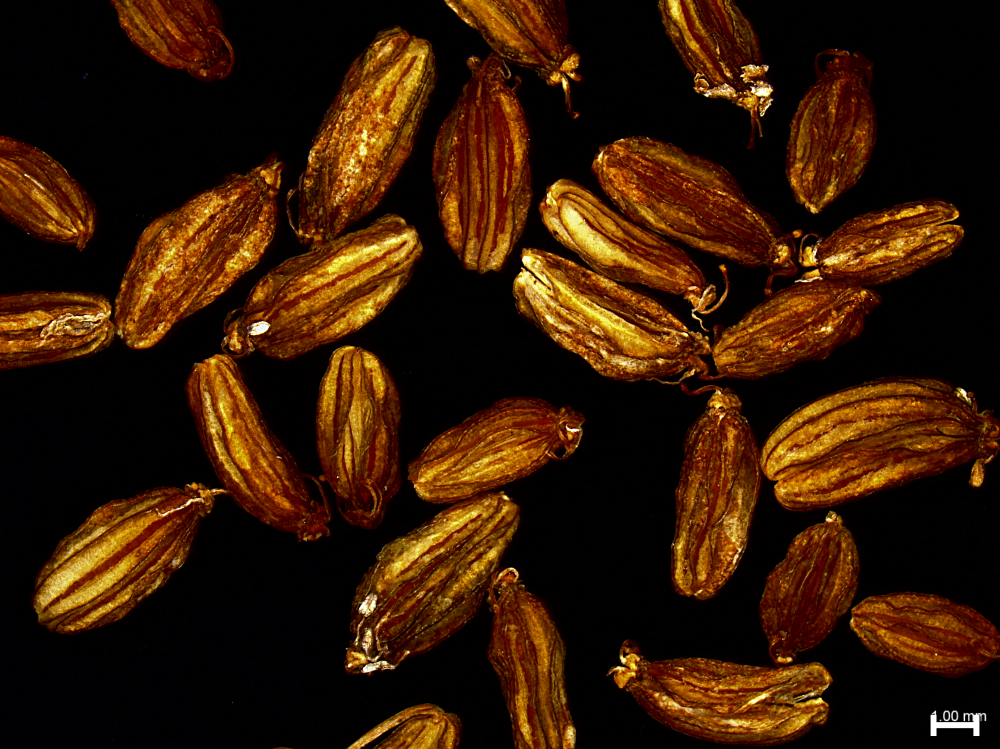

In [ ]:
#image path 저장
images = os.path.join(train_dir, train_fnames[0])

#image 읽어오기
image = cv2.imread(images)

#image 보여주기
cv2_imshow(image)

#image 저장하기
#cv2.imwrite(저장할 경로 및 파일 명, 저장할 이미지)

In [ ]:
#읽어들이 이미지 크기(해상도) 
image.shape

#가로*세로*채널(RGB 3채널)

(2693, 3595, 3)

#### 전처리 방법 정리

참고

 openCV


> https://ivo-lee.tistory.com/91


> https://velog.io/@jaehyeong/OpenCV%EB%A5%BC-%ED%99%9C%EC%9A%A9%ED%95%9C-%EA%B8%B0%EC%B4%88-%EC%9D%B4%EB%AF%B8%EC%A7%80-%EC%B2%98%EB%A6%AC-with-Python




##### resize

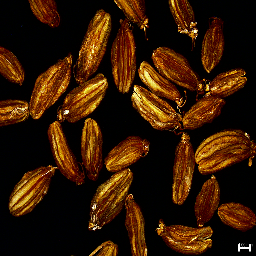

In [ ]:
#전처리 - 이미지 크기 조절 256*256
re_img = cv2.resize(image,(256,256))
cv2_imshow(re_img)

##### sharp(선명하게)

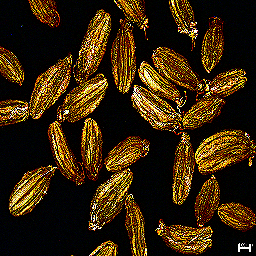

In [ ]:
#전처리 - 이미지 선명하게 표현하기

# 커널 생성(대상이 있는 픽셀을 강조)
kernel = np.array([[0, -1, 0],
                   [-1, 5, -1],
                   [0, -1, 0]])

# 커널 적용 
image_sharp = cv2.filter2D(re_img, -1, kernel)

cv2_imshow(image_sharp)

##### equalizeHist() 이미지 대비 높이기

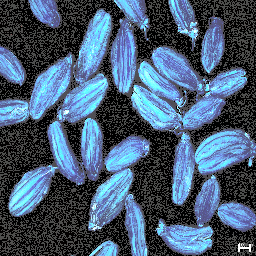

In [ ]:
#전처리 - 이미지 대비 높이기
#히스토그램 평활화(Histogram Equalization)은 객체의 형태가 두드러지도록 만들어주는 이미지 처리 도구
#equalizeHist() 메소드 사용
#컬러이미지 : RGB --> YUV --> RGB 포맷 변경 필요

# YUV 컬로 포맷으로 변환
image_yuv = cv2.cvtColor(re_img, cv2.COLOR_BGR2YUV)
# 히스토그램 평활화 적용
image_yuv[:, :, 0] = cv2.equalizeHist(image_yuv[:, :, 0])
# #RGB로 변환
image_rgb = cv2.cvtColor(image_yuv, cv2.COLOR_YUV2RGB)

cv2_imshow(image_rgb)

##### 이미지 특성 추출

그러나  **밑의 코드는 이상함. 다시 찾기**

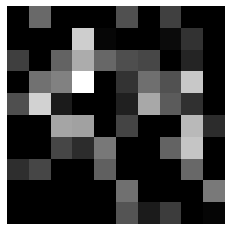

(100,)

In [ ]:
#전처리 - 이미지에서 특성 뽑기

#흑백으로 이미지 읽기
grey_img = cv2.imread(images, cv2.IMREAD_GRAYSCALE)
image_10x10 = cv2.resize(grey_img, (10, 10)) # 이미지가 클수록 특성 개수 증가
image_10x10.flatten() # 이미지 데이터를 1차원 벡터로 변환

plt.imshow(image_10x10, cmap="gray"), plt.axis("off")
plt.show()

image_10x10.flatten().shape #이미지 데이터를 1차원 벡터로 변환하고 차원을 출력

In [ ]:
image_10x10

array([[  0,  80,   0,   0,   0,  61,   0,  49,   0,   0],
       [  0,   0,   0, 156,   5,   0,   0,   9,  38,   0],
       [ 48,   0,  75, 130,  78,  59,  54,   0,  28,   0],
       [  0,  86,  98, 193,   0,  39,  84,  62, 151,   0],
       [ 60, 159,  21,   0,   0,  25, 127,  69,  37,   0],
       [  0,   0, 125, 122,   0,  52,   0,   0, 140,  34],
       [  0,   0,  53,  34,  91,   0,   0,  75, 149,   0],
       [ 35,  53,   0,   0,  73,   0,   0,   0,  79,   0],
       [  0,   0,   0,   0,   0,  85,   0,   0,   0,  92],
       [  0,   0,   0,   0,   0,  64,  21,  46,   0,   4]], dtype=uint8)

##### rotation

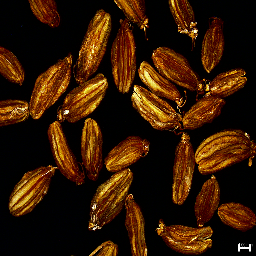

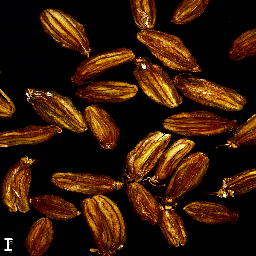

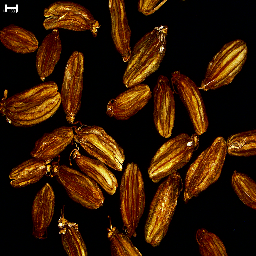

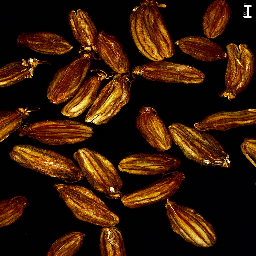

In [ ]:
#전처리 - 이미지 회전

img90 = cv2.rotate(re_img, cv2.ROTATE_90_CLOCKWISE) # 시계방향으로 90도 회전
img180 = cv2.rotate(re_img, cv2.ROTATE_180) # 180도 회전
img270 = cv2.rotate(re_img, cv2.ROTATE_90_COUNTERCLOCKWISE) # 반시계방향으로 90도 회전 = 시계방향으로 270도 회전

cv2_imshow(re_img)
cv2_imshow(img90)
cv2_imshow(img180)
cv2_imshow(img270)

##### color

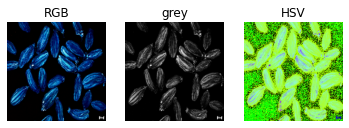

In [ ]:
#전처리 - 색 공간 변환

plt.subplot(131)
plt.imshow(re_img)
plt.axis("off")
plt.title("RGB")

plt.subplot(132)
plt.imshow(color.rgb2gray(re_img), cmap=plt.cm.gray)
plt.axis("off")
plt.title("grey")

plt.subplot(133)
plt.imshow(color.rgb2hsv(re_img))
plt.axis("off")
plt.title("HSV")

plt.show()


##### 밝기



> https://jvvp.tistory.com/1030

> https://computistics.tistory.com/36?category=962008



30~50 사이가 괜찮은듯

In [ ]:
#함수로 만들기
def bright(val) :
  #배열을 쓰는 이유 : RGB값 모두 더해줘야 하므로
  #배열을 쓰지 않으면 한 값만 커지거나 작아진다.
  array = np.full(re_img.shape, (val, val, val), dtype=np.uint8)

  #더 밝게 하는 add
  add = cv2.add(re_img, array) 

  #더 어둡게 하는 sub
  sub = cv2.subtract(re_img, array)

  #출력
  cv2_imshow(re_img)
  cv2_imshow(add)
  cv2_imshow(sub)

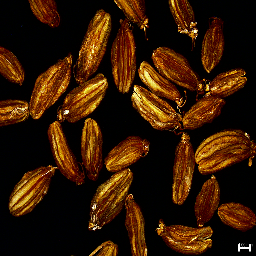

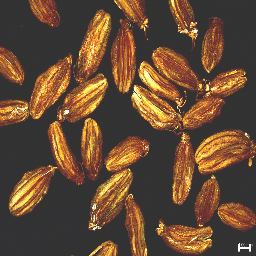

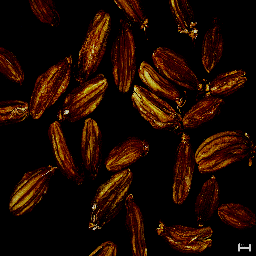

In [ ]:
#전처리 - 밝기 조절 50

#얼만큼을 변화시킬건지
val = 50 

#배열을 쓰는 이유 : RGB값 모두 더해줘야 하므로
#배열을 쓰지 않으면 한 값만 커지거나 작아진다.
array = np.full(re_img.shape, (val, val, val), dtype=np.uint8)

#더 밝게 하는 add
add = cv2.add(re_img, array) 

#더 어둡게 하는 sub
sub = cv2.subtract(re_img, array)

#출력
cv2_imshow(re_img)
cv2_imshow(add)
cv2_imshow(sub)

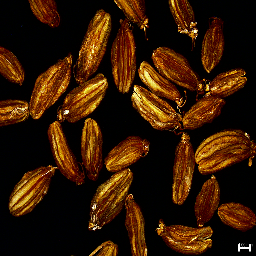

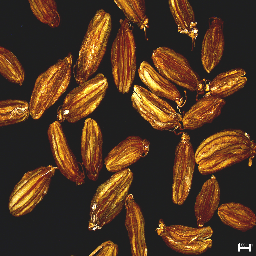

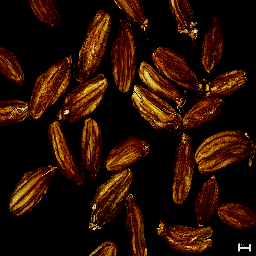

In [ ]:
#밝기 30
bright(30)